**Teammates:**
* Yaryna Fialko
* Natalia Chaika
* Shvets Anastasiia

## Intro

1. Submit this task as a link to your team's Google Colab (https://colab.research.google.com/notebooks/intro.ipynb#). Make sure you made a copy of this notebook and opened it via UCU email address.

2. Please use cv2 standard methods for reading and resizing the images, and matplotlib or cv2 imshow function for displaying it.

3. There should be only one submission per team. However, don't forget to choose a person from your team who would submit the task, and **make sure that the names of all team members are listed in the notebook**. Teammates not mentioned in the notebook will not be graded for this lab.  

4. Your final grade will be a product of grade for the coding and explanatory part and coefficient for the oral defense (will be announced later). Please note that your final mark for this assignment will consist of three components:
  *   Coding part
  *   Explanations
  *   Oral defense (to be scheduled later)

  Make sure you include detailed theoretical explanations where necessary.

5. **Important**: during the implementation, you are welcomed to use `cv2` methods, but you must also implement the transformation matrices yourself (except image **reading**, **recizing** and **displaying**). Finally, as a successful result, you can demonstrate that the outputs of both approaches coincide!




In [ ]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
%matplotlib inline


%env IMAGES_PERMALINK=https://raw.githubusercontent.com/andylvua/la_lab1_data/main/images
!wget -nc $IMAGES_PERMALINK/img1.jpg -P ./images
!wget -nc $IMAGES_PERMALINK/img2.jpg -P ./images

env: IMAGES_PERMALINK=https://raw.githubusercontent.com/andylvua/la_lab1_data/main/images
--2023-03-14 12:42:46--  https://raw.githubusercontent.com/andylvua/la_lab1_data/main/images/img1.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 736335 (719K) [image/jpeg]
Saving to: ‘./images/img1.jpg’

img1.jpg            100%[===================>] 719.08K  --.-KB/s    in 0.03s   

2023-03-14 12:42:46 (22.2 MB/s) - ‘./images/img1.jpg’ saved [736335/736335]

--2023-03-14 12:42:47--  https://raw.githubusercontent.com/andylvua/la_lab1_data/main/images/img2.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:44

## 1.

Recall that a linear transformation is a mapping $T: \mathbb{R}^n \rightarrow \mathbb{R}^m$ such that
$\forall c_1, c_2 \in \mathbb{R}, \mathbf{u}_1, \mathbf{u}_2 \in \mathbb{R}^n$  
$T(c_1 \mathbf{u}_1 + c_2 \mathbf{u}_2) = c_1T(\mathbf{u}_1) + c_2T(\mathbf{u}_2)$.  

In this lab you will study some of the common transformations in $\mathbb{R}^2$, derive their general matrix form, explain what a resulting image will look like and apply transformations to the vectors and pictures.

Each linear transformation can be represented as a matrix. In case of an image linear transformation is applied to a pixel position on xy-plane, transforming its coordinates $(x, y)$ to $(x', y')$ but retaining the color. However, the image is usually represented as an array of pixels, thus having the dimension (image height, image width, 3) if the color is represented in RGB system. You can use *warpAffine()* function from cv2 to perform transformations on the image, or you can implement a function that manipulates each pixel's position given an array of pixels and calculate the transformation matrix on your own.

### 1.1 Image preparation

First, load image 1, resize it to a more convenient form, and examine its representation.

The shape of the image is (586, 880, 3)


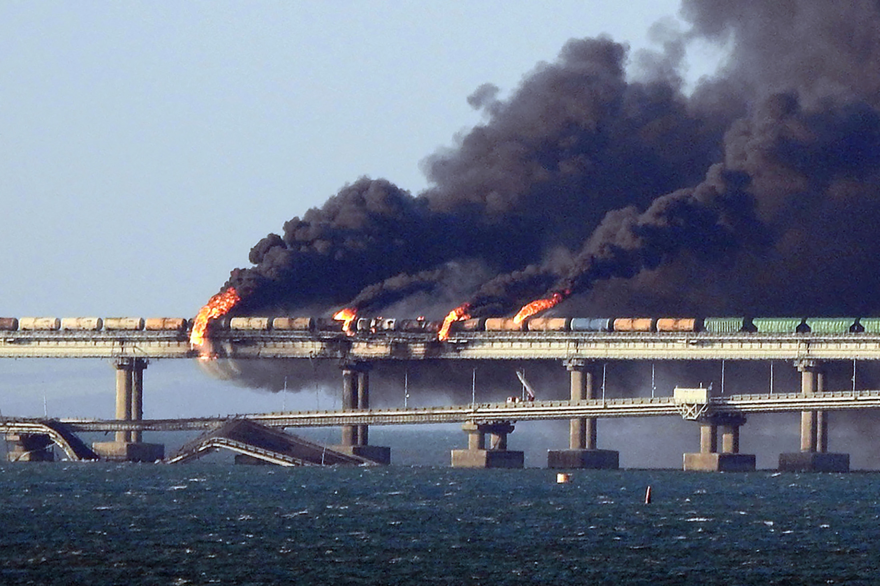

In [ ]:
# Load images

##### YOUR CODE STARTS #####

img1_path = './images/img1.jpg'
image = cv.imread(img1_path)

scale = 0.4
new_x = int(image.shape[1] * scale)
new_y = int(image.shape[0] * scale)
resized = cv.resize(image, (new_x, new_y), interpolation = cv.INTER_AREA)

print(f"The shape of the image is {resized.shape}")
cv2_imshow(resized)

##### YOUR CODE ENDS ##### 

 What is this image's shape? What do the values mean?

The shape of the image is **(586, 880, 3)**, where the first number is the height of the image, and second is the width, third one is the number of channels in the image (in our case 3 channels means that the image is in the RGB color space).

### 1.2 Rotation matrix

Rotation is a linear transformation of some space that preserves at least one point. An example of rotation by angle $\psi$ on xy-plane is depicted on the image below:   
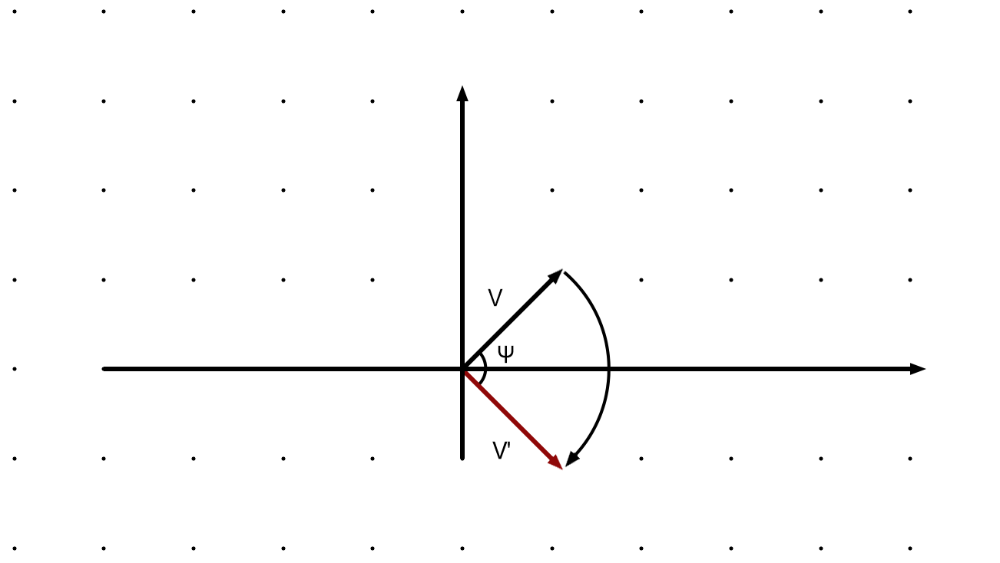

What is the transformation matrix that corresponds to rotation by a generic angle $\phi$?

The transformation matrix for rotation by $\phi$ counterclockwise (in positive direction) is:
$$
\begin{pmatrix}
\cos(\phi) & -\sin(\phi) \\
\sin(\phi) & \cos(\phi)
\end{pmatrix}
$$

So that, when the coordinates of the original vector are $(x, y)$, the coordinates after rotation $(x', y')$ are:
$$ \begin{pmatrix} x'\\ y' \end{pmatrix}  = 
\begin{pmatrix}
\cos(\phi) & -\sin(\phi) \\
\sin(\phi) & \cos(\phi)
\end{pmatrix} 
\cdot
\begin{pmatrix} x\\ y \end{pmatrix} =
\begin{pmatrix}
x \cos(\phi) - y \sin(\phi) \\
x \sin(\phi) + y \cos(\phi)
\end{pmatrix} $$

Your next task is to implement a function that calculates the rotation matrix and apply it to a vector and to an image to rotate them by $45^\circ$.
First, construct the rotation matrix:

In [ ]:
# Create rotation matrix

def get_rotation_matrix(phi):
  rad_phi = np.deg2rad(phi)
  phi_sin = np.sin(rad_phi)
  phi_cos = np.cos(rad_phi)
  transformation_matrix = np.array([[phi_cos, -phi_sin], 
                           [phi_sin, phi_cos]])
  return transformation_matrix

phi = 45
M = get_rotation_matrix(phi)
print("Rotation matrix is")
print(M)

Rotation matrix is
[[ 0.70710678 -0.70710678]
 [ 0.70710678  0.70710678]]


Second, we'll apply the transformation to a vector. Let's check what our vector looks like now:


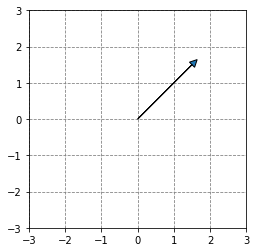

In [ ]:
A = np.array([0, 0])
B1 = np.array([1.5, 1.5])

ax = plt.axes()

ax.arrow(A[0], A[1], B1[0], B1[1], head_width=0.2, head_length=0.2)
plt.ylim(-3,3)
plt.xlim(-3,3)

ax.set_axisbelow(True)
plt.grid(color='gray', linestyle='dashed')
plt.gca().set_aspect('equal', adjustable='box')

plt.show()

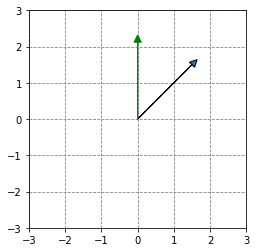

In [ ]:
# Apply rotation to the vector AB1 to get vector AB2

##### YOUR CODE STARTS #####
A = np.array([0, 0])
B1 = np.array([1.5, 1.5])
B2 = M @ B1
##### YOUR CODE ENDS #####

ax = plt.axes()

ax.arrow(A[0], A[1], B1[0], B1[1], head_width=0.2, head_length=0.2)
ax.arrow(A[0], A[1], B2[0], B2[1], head_width=0.2, head_length=0.2, color='green')
plt.ylim(-3,3)
plt.xlim(-3,3)

ax.set_axisbelow(True)
plt.grid(color='gray', linestyle='dashed')
plt.gca().set_aspect('equal', adjustable='box')

plt.show()

You can also rotate images! Check how below:

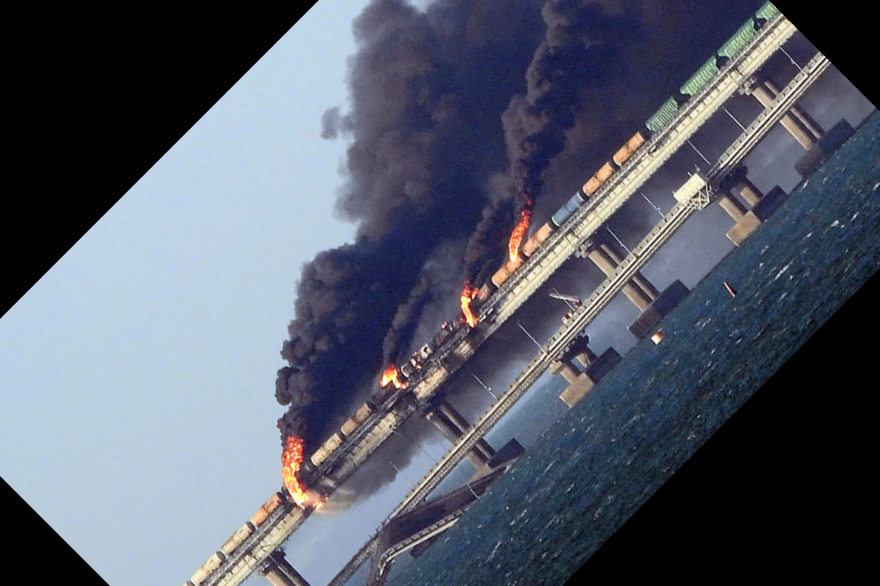

In [ ]:
##### YOUR CODE STARTS #####
def get_img_rotation_matrix(phi, center):
  rad_phi = np.deg2rad(phi)
  phi_sin = np.sin(rad_phi)
  phi_cos = np.cos(rad_phi)
  transformation_matrix = np.array([[phi_cos, phi_sin, (1 - phi_cos) * center[0] - phi_sin * center[1]],
                     [-phi_sin, phi_cos, phi_sin * center[0] + (1 - phi_cos) * center[1]]])
  return transformation_matrix

M = get_img_rotation_matrix(phi, (resized.shape[1] / 2, resized.shape[0] / 2))
rotated = cv.warpAffine(resized, M, (resized.shape[1], resized.shape[0]),  flags = cv.INTER_LINEAR, borderMode = cv.BORDER_CONSTANT)
##### YOUR CODE ENDS #####

cv2_imshow(rotated)


### 1.3 Scaling matrix

Scaling is a tranformation that enlarges or diminishes objects by a factor. For scaling in 2D space a factor can be represented as a vector $(x_s, y_s)$ where $x_s$ and $y_s$ are scaling factors for each respective axis (those factors don't have to be equal). On the picture below, V' represents vector V scaled by a factor (0.5, 1) and V'' - by (0.5, 0.5).
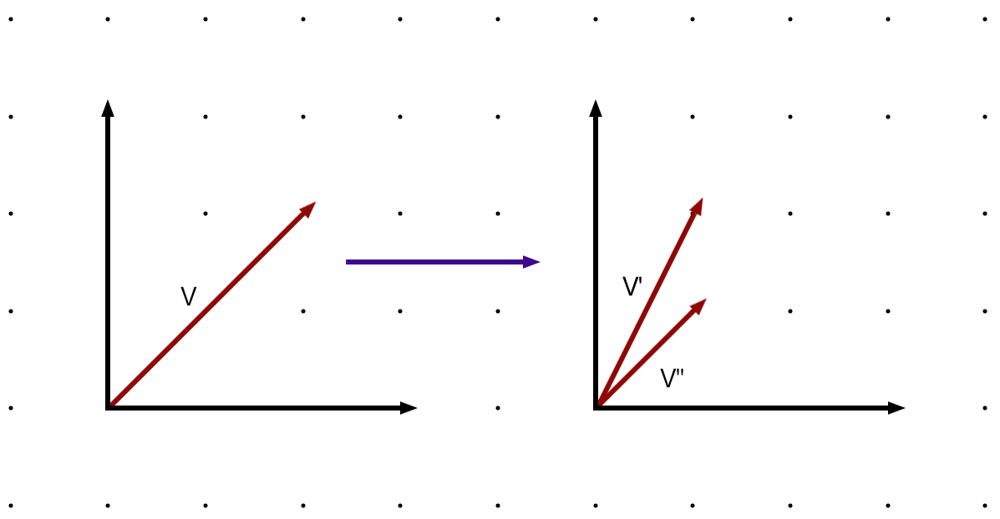

In this part, you should derive a general form for a scaling matrix and apply scaling by a factor of (1, 0.5) to the vector and the image. First, explain how you derive the scaling matrix:

f - factor (in the above example f = 1.5)

\\
$$ \begin{pmatrix} x'\\ y' \end{pmatrix}  = 
\begin{pmatrix}
\ s & 0 \\
\ 0 & s
\end{pmatrix} 
\cdot
\begin{pmatrix} x\\ y \end{pmatrix} =
\begin{pmatrix}
sx \\
sy
\end{pmatrix} $$

In [ ]:
##### YOUR CODE STARTS #####
def get_scaling_matrix(scale_factor_x, scale_factor_y):
    S = np.array([[scale_factor_x, 0], [0, scale_factor_y]])
    return S

M2 = get_scaling_matrix(1, 0.5)

##### YOUR CODE ENDS #####
print("Scaling matrix is")
print(M2)

Scaling matrix is
[[1.  0. ]
 [0.  0.5]]


Second, apply scaling by (1, 0.5) to the vector.

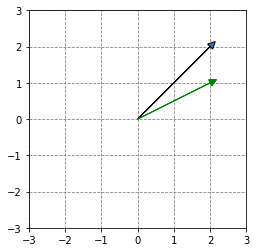

In [ ]:
# Apply scaling to the vector AB1 to achieve vector AB2

##### YOUR CODE STARTS #####
A = np.array([0, 0])
B1 = np.array([2, 2])
B2 = M2 @ B1
##### YOUR CODE ENDS #####

ax = plt.axes()

ax.arrow(A[0], A[1], B1[0], B1[1], head_width=0.2, head_length=0.2)
ax.arrow(A[0], A[1], B2[0], B2[1], head_width=0.2, head_length=0.2, color='green')
plt.ylim(-3,3)
plt.xlim(-3,3)

ax.set_axisbelow(True)
plt.grid(color='gray', linestyle='dashed')
plt.gca().set_aspect('equal', adjustable='box')

plt.show()

Now, apply scaling by the same factor to the image:

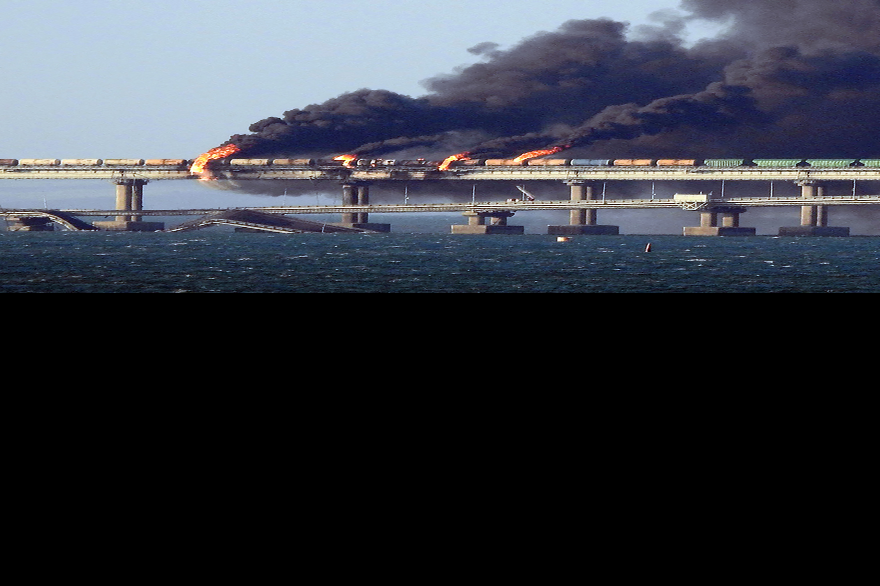

In [ ]:
##### YOUR CODE STARTS #####

def get_img_scaling_matrix(scale_factor_x, scale_factor_y):
    """
    Returns the scaling matrix for the given scaling factors in the x and y direction using OpenCV's warpAffine.
    """
    S = np.float32([[scale_factor_x, 0, 0], [0, scale_factor_y, 0]])
    return S


M2 = get_img_scaling_matrix(1, 0.5)
scaled = cv.warpAffine(resized, M2, (resized.shape[1], resized.shape[0]))
##### YOUR CODE ENDS #####
cv2_imshow(scaled)

### 1.4 Shear matrix

Horizontal shearing moves each point in a fixed direction by distance proportional to y-coordinate of the point. Shear map changes angles and lengths of line segments.

In this part, you needs to build a shearing matrix, find a transformation matrix that moves the point $(x, y)$ to $(x+1.5y, y)$, and apply it to the vector and the image. First, explain how do you build a matrix that corresponds to a shearing transformation:

f - factor (in the above example f = 1.5)

\\
$$ \begin{pmatrix} x'\\ y' \end{pmatrix}  = 
\begin{pmatrix}
\ 1 & f \\
\ 0 & 1
\end{pmatrix} 
\cdot
\begin{pmatrix} x\\ y \end{pmatrix} =
\begin{pmatrix}
x  +   fy \\
y
\end{pmatrix} $$

Second, implement a function for constructing such a matrix:

In [ ]:
##### YOUR CODE STARTS #####
def get_horizontal_shear_matrix(factor):
    transformation_matrix = np.array([[1, factor], 
                           [0, 1]])
    return transformation_matrix

factor = 1.5
M3 = get_horizontal_shear_matrix(factor)
##### YOUR CODE ENDS #####
print("Shearing matrix is")
print(M3)

Shearing matrix is
[[1.  1.5]
 [0.  1. ]]


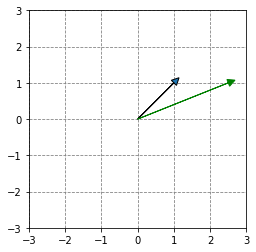

In [ ]:
# Apply shearing to the vector AB1 to achieve vector AB2

##### YOUR CODE STARTS #####
A =  np.array([0, 0])
B1 = np.array([1, 1])
B2 = M3 @ B1
##### YOUR CODE ENDS #####

ax = plt.axes()

ax.arrow(A[0], A[1], B1[0], B1[1], head_width=0.2, head_length=0.2)
ax.arrow(A[0], A[1], B2[0], B2[1], head_width=0.2, head_length=0.2, color='green')
plt.ylim(-3,3)
plt.xlim(-3,3)

ax.set_axisbelow(True)
plt.grid(color='gray', linestyle='dashed')
plt.gca().set_aspect('equal', adjustable='box')

plt.show()

Finally, apply this shearing transformation to the image. 

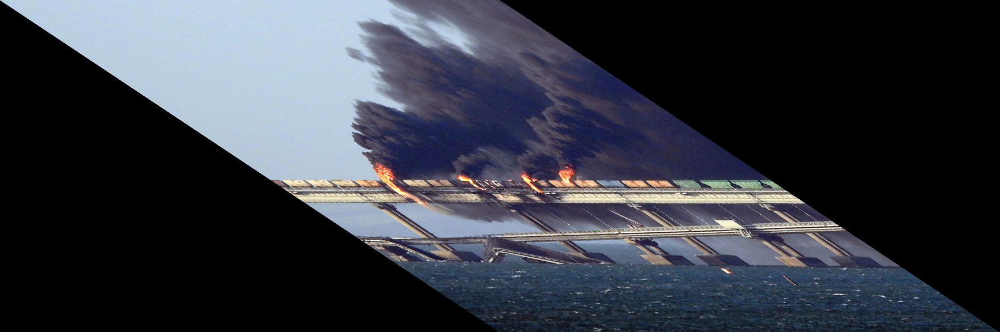

In [ ]:
##### YOUR CODE STARTS #####
def get_img_horizontal_shear_matrix(factor):
    """
    Returns the horizontal shear matrix for the given shear factor using OpenCV's warpAffine.
    """
    H = np.float32([[1, factor, 0], [0, 1, 0]])
    return H


M3 = get_img_horizontal_shear_matrix(1.5)
sheared = cv.warpAffine(resized, M3, (resized.shape[1] * 2, resized.shape[0]))

##### YOUR CODE ENDS #####
cv2_imshow(sheared)

### 1.5 Translation matrix

Translation is a transformation that moves every point of a figure by a fixed distance.


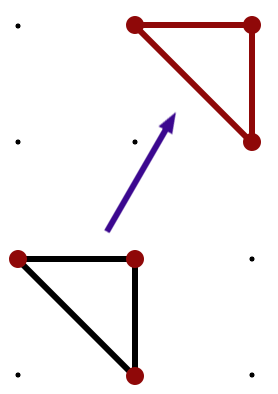

Here, you should build a translation matrix and apply translation by $(20, 25)$ to the vector and to the image. Start from explaining how to construct a translation matrix:

\\
$$ \begin{pmatrix} x'\\ y' \\ 1\end{pmatrix}  = 
\begin{pmatrix}
\ 1 & 0 & t_x \\
\ 0 & 1 & t_y \\
\ 0 & 0 & 1
\end{pmatrix} 
\cdot
\begin{pmatrix} x\\ y \\ 1 \end{pmatrix} =
\begin{pmatrix}
x + t_x \\
y + t_y \\
1
\end{pmatrix} $$

Then, implement a function that produces such a matrix:

In [ ]:
##### YOUR CODE STARTS #####
def get_translation_matrix(translation_factor_x, translation_factor_y):
    translation_matrix = np.array([[1, 0, translation_factor_x], 
                                   [0, 1, translation_factor_y],
                                   [0, 0, 1]])
    return translation_matrix                              
  # return translation_matrix

M4 = get_translation_matrix(20, 25)
##### YOUR CODE ENDS #####
print("Translation matrix is")
print(M4)

Translation matrix is
[[ 1  0 20]
 [ 0  1 25]
 [ 0  0  1]]


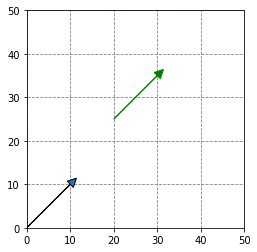

In [ ]:
# Apply translation to the vector A1B1 to achieve vector A2B2

##### YOUR CODE STARTS #####
A1 = np.array([0, 0, 1])
B1 = np.array([10, 10, 1])
A2 = M4 @ A1
B2 = M4 @ B1
##### YOUR CODE ENDS #####

ax = plt.axes()

ax.arrow(A1[0], A1[1], B1[0], B1[1], head_width=2, head_length=2)
ax.arrow(A2[0], A2[1], B2[0]-A2[0], B2[1]-A2[1], head_width=2, head_length=2, color='green')
plt.ylim(0,50)
plt.xlim(0,50)

ax.set_axisbelow(True)
plt.grid(color='gray', linestyle='dashed')
plt.gca().set_aspect('equal', adjustable='box')

plt.show()

Finally, apply the translation by $(20, 25)$ to the image.

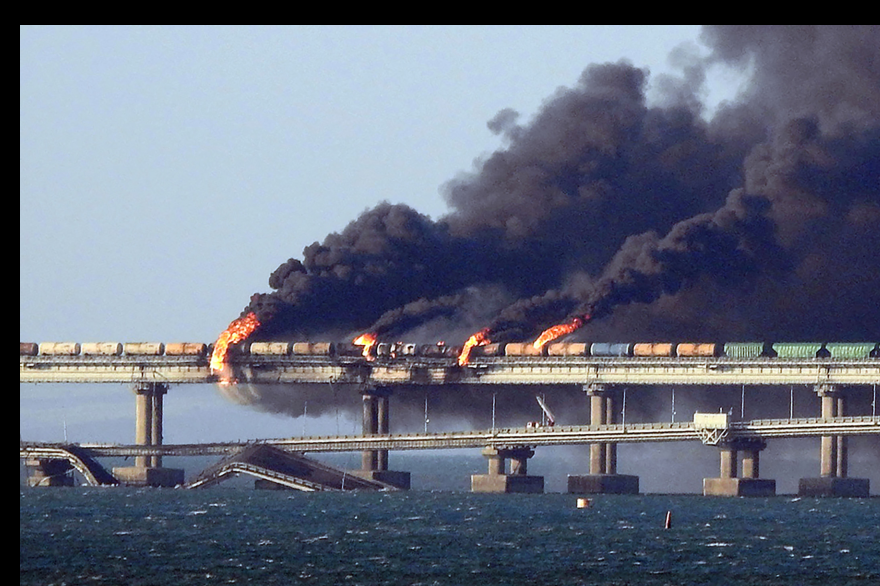

In [ ]:
##### YOUR CODE STARTS #####
def get_img_translation_matrix(translation_factor_x, translation_factor_y):
  translation_matrix = np.float32([[1, 0, translation_factor_x],  
                                 [0, 1, translation_factor_y]])
  return translation_matrix


M4 = get_img_translation_matrix(20, 25)
translated =  cv.warpAffine(resized, M4, (resized.shape[1] + 25, resized.shape[0] + 25))
##### YOUR CODE ENDS #####
cv2_imshow(translated)

### 1.6 Mirror symmetry 
Vertical mirror symmetry maps coordinates $(x, y)$ to $(-x,y)$.

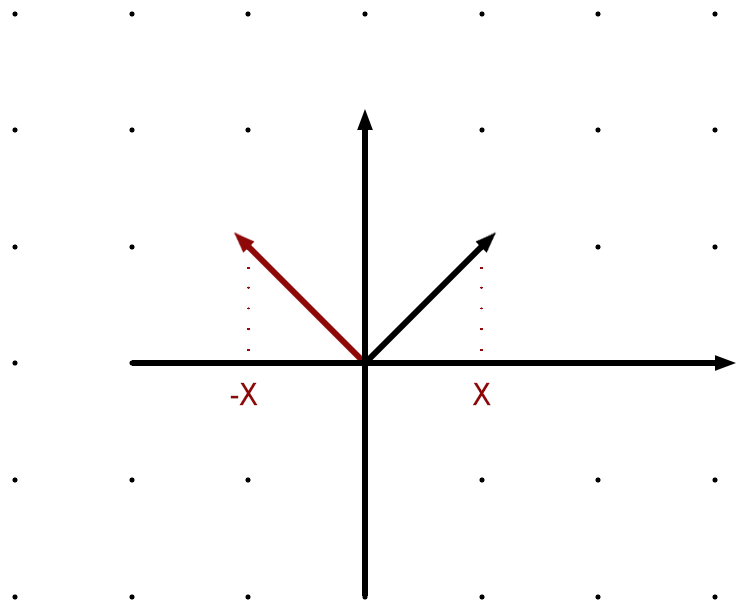

As in the previous parts, you need to provide the explanation, implement a function that produces a vertical symmetry matrix, and apply it to the vector and to the image.


\\
$$ \begin{pmatrix} x'\\ y'\end{pmatrix}  = 
\begin{pmatrix}
\ -1 & 0  \\
\ 0 & 1
\end{pmatrix} 
\cdot
\begin{pmatrix} x\\ y \end{pmatrix} =
\begin{pmatrix}
-x \\
y
\end{pmatrix} $$


In [ ]:
##### YOUR CODE STARTS #####
def get_horizontal_mirror_marix():
    horizontal_mirror_marix = np.array([[-1, 0], 
                                        [0, 1]])
    return horizontal_mirror_marix

M5 = get_horizontal_mirror_marix()
##### YOUR CODE ENDS #####
print("Mirroring matrix is")
print(M5)

Mirroring matrix is
[[-1  0]
 [ 0  1]]


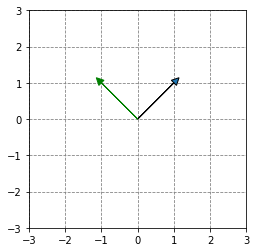

In [ ]:
# Apply mirroring to the vector AB1 to achieve vector AB2

##### YOUR CODE STARTS #####
A = np.array([0, 0])
B1 = np.array([1, 1])
B2 = M5 @ B1
##### YOUR CODE ENDS #####

ax = plt.axes()

ax.arrow(A[0], A[1], B1[0], B1[1], head_width=0.2, head_length=0.2)
ax.arrow(A[0], A[1], B2[0], B2[1], head_width=0.2, head_length=0.2, color='green')
plt.ylim(-3,3)
plt.xlim(-3,3)

ax.set_axisbelow(True)
plt.grid(color='gray', linestyle='dashed')
plt.gca().set_aspect('equal', adjustable='box')

plt.show()

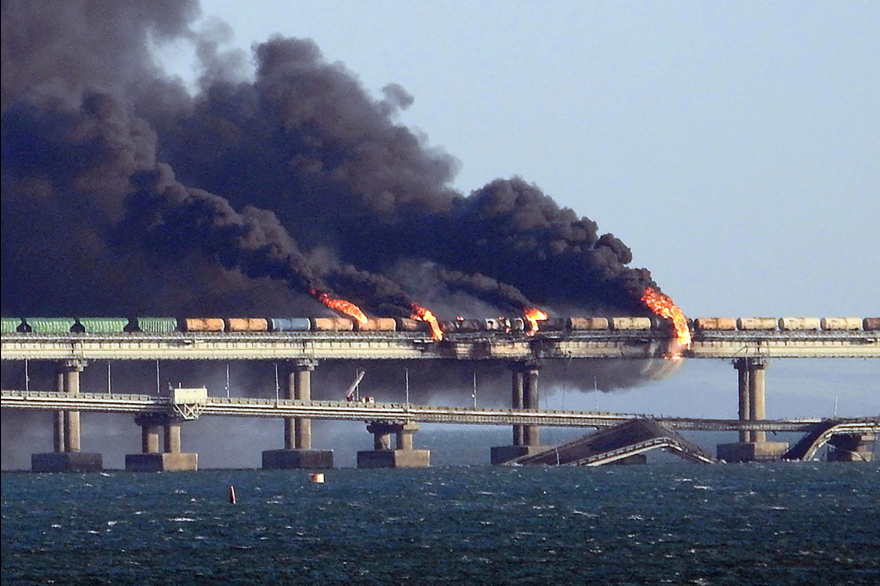

In [ ]:
##### YOUR CODE STARTS #####
def get_img_horizontal_mirror_marix(img_width):
    horizontal_mirror_marix = np.float32([[-1, 0, img_width], 
                                        [0, 1, 0]])
    return horizontal_mirror_marix

M5 = get_img_horizontal_mirror_marix(resized.shape[1])
mirrored = cv.warpAffine(resized, M5, (resized.shape[1], resized.shape[0]))
##### YOUR CODE ENDS #####
cv2_imshow(mirrored)

## 2.

### 2.1 Perspective shift matrix

You will need to use img2.jpg for this task. Load and resize it using the same commands you used for preparing img1.

The main goal of perspective transformation (or perspective rectification) is to synthesize a perspective-free view of an object given a photo taken at an angle.   

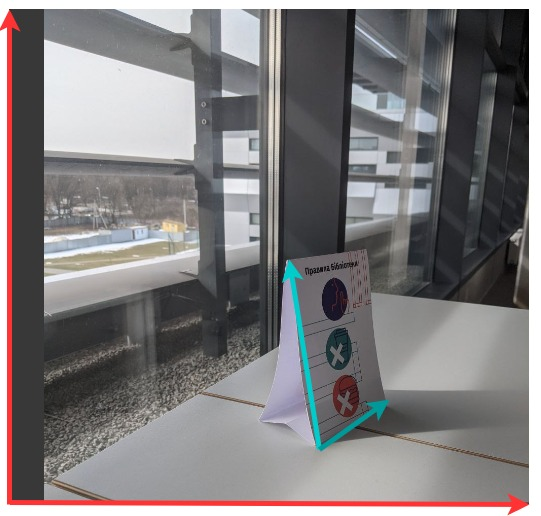

As you see on the picture above, the initial picture has a standard basis of red vectors. We want to transform all of the vectors in the picture so that the blue vectors will become the new basis.

To find this transformation matrix, you need to choose 4 points on the input image and corresponding points on the output image (3 of these points should not be collinear).In this case, the transformation matrix is a 3 by 3 matrix that satisfies the following equation, where ($x_i$, $y_i$) is the source vector and ($u_i$, $v_i$) is  the destination vector:

$u_i = \dfrac{c_{00}*x_i + c_{01}*y_i + c_{02}}{ c_{20}*x_i + c_{21}*y_i + c_{22}}$

$v_i = \dfrac{c_{10}*x_i + c_{11}*y_i + c_{12}}{c_{20}*x_i + c_{21}*y_i + c_{22}}$

In other words, we want to find a transformation that maps each of our initial 4 points $(x_i,y_i)$ to 4 points with new coordinates $(u_i, v_i)$.

Find coefficients $c_{ij}$ via solving the linear system containing source and destination coordinates and nine $c$ coefficients with numpy methods and apply it to an image so that the sign is clearly visible. 
(Hint: $c_{22} = 1$)

First, start from explaining how the system was constructed.


We choose four points in the source image and their corresponding positions in the destination image. These four points are not collinear.

We store the coordinates of the four points in two matrices, where each matrix contains the (x,y) coordinates of the four points.

To construct the system, we choose 4 points on the input image and corresponding points on the output image. We make sure that three of the points are not collinear to ensure that the system is solvable. This gives us a system of 8 linear equations with 8 unknowns.

We can represent the system as a matrix equation Ax=b, where A is an 8x8 matrix, x is an 8x1 vector of unknowns, and b is an 8x1 vector containing the destination coordinates.



Next, prepare the second image:

The shape of the image is (500, 500, 3)


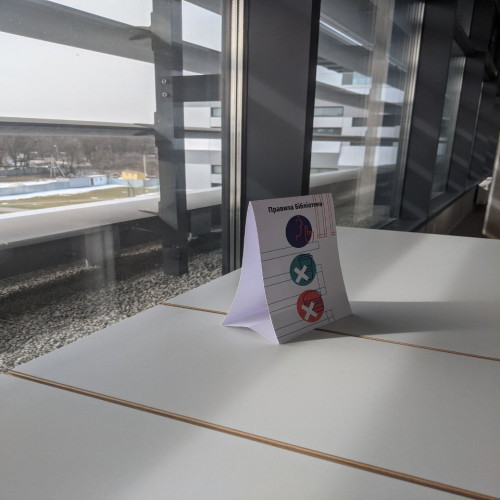

In [ ]:
##### YOUR CODE STARTS #####
img2_path = './images/img2.jpg'
image2 = cv.imread(img2_path)

resized = cv.resize(image2, (500, 500), interpolation = cv.INTER_AREA)

print(f"The shape of the image is {resized.shape}")
cv2_imshow(resized)
# ##### YOUR CODE ENDS #####
# image2 = cv.imread(img2_path)
# cv2_imshow(image2)

Implement the function that constructs a perspective shift matrix and apply it to the image.

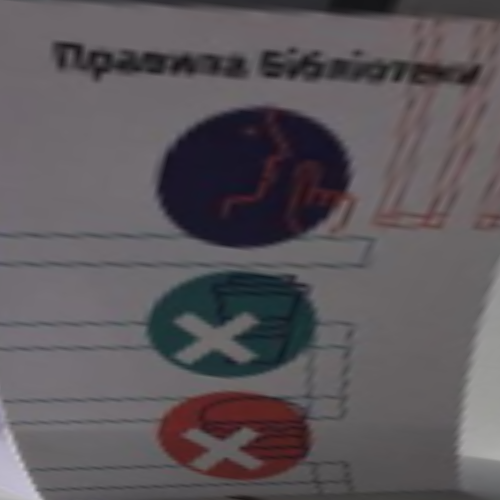

In [ ]:
##### YOUR CODE STARTS #####
def get_perspective_transform_matrix(source, destination):

    # Define the matrix A and vector b
    A = np.zeros((8, 8))
    b = np.zeros((8, 1))

    for i in range(4):
        # Get the source and destination points
        x, y = source[i]
        u, v = destination[i]

        # Fill the matrix A and vector b
        A[i*2, :] = [x, y, 1, 0, 0, 0, -u*x, -u*y]
        A[i*2+1, :] = [0, 0, 0, x, y, 1, -v*x, -v*y]
        b[i*2, 0] = u
        b[i*2+1, 0] = v

    # Solve the linear system of equations
    h = np.linalg.solve(A, b).reshape(8,)

    # Reshape the vector h into the transformation matrix H
    H = np.append(h, 1)
    H = H.reshape(3, 3)

    return H

source_points = np.float32([[260, 200], [320, 190] , [270, 345], [360, 315]])
destination_points = np.float32([[0, 0], [500, 0], [0, 500], [500, 500]])

perspective_shift_m = get_perspective_transform_matrix(source_points, destination_points)

transformed = cv.warpPerspective(resized, perspective_shift_m, (resized.shape[1], resized.shape[0]))
cv2_imshow(transformed)
##### YOUR CODE ENDS #####

### 2.2 Composition of transformations

Apply the following transformations to the original image in the specified order and observe the results displayed side-by-side.

1) Scaling by $(1.5, 2)$, rotation by $18^\circ$ and translation by $(10, 15)$.  
2) Translation by $(10, 15)$, scaling by $(1.5, 2)$, rotation by $18^\circ$.

---------------------------
Scaling by  (1.5,2) , rotation by  18∘  and translation by  (10,15)
---------------------------


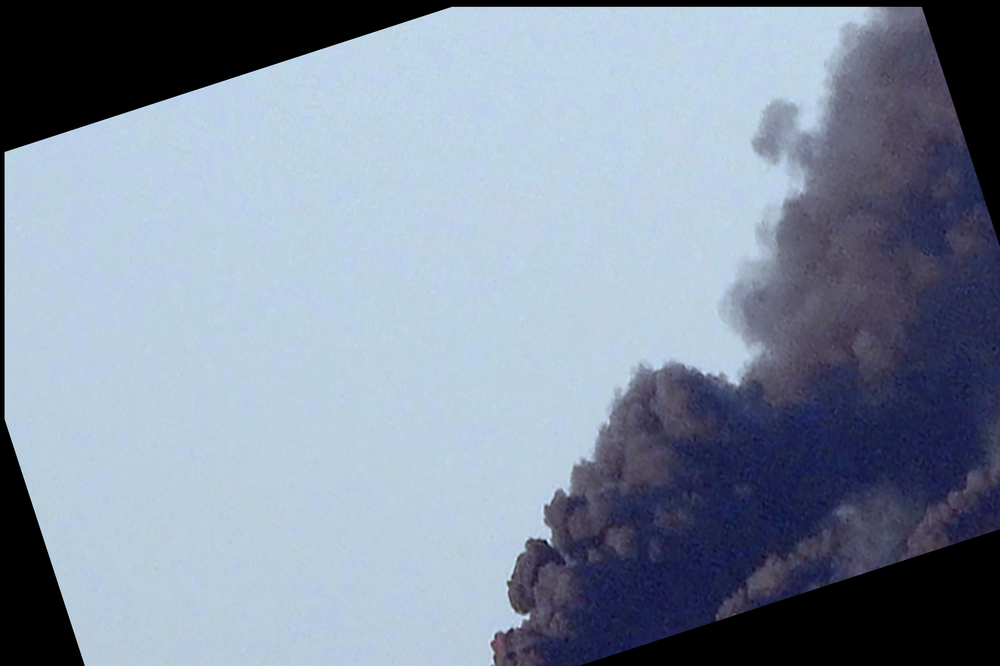

---------------------------
Translation by  (10,15) , scaling by  (1.5,2) , rotation by  18∘
---------------------------


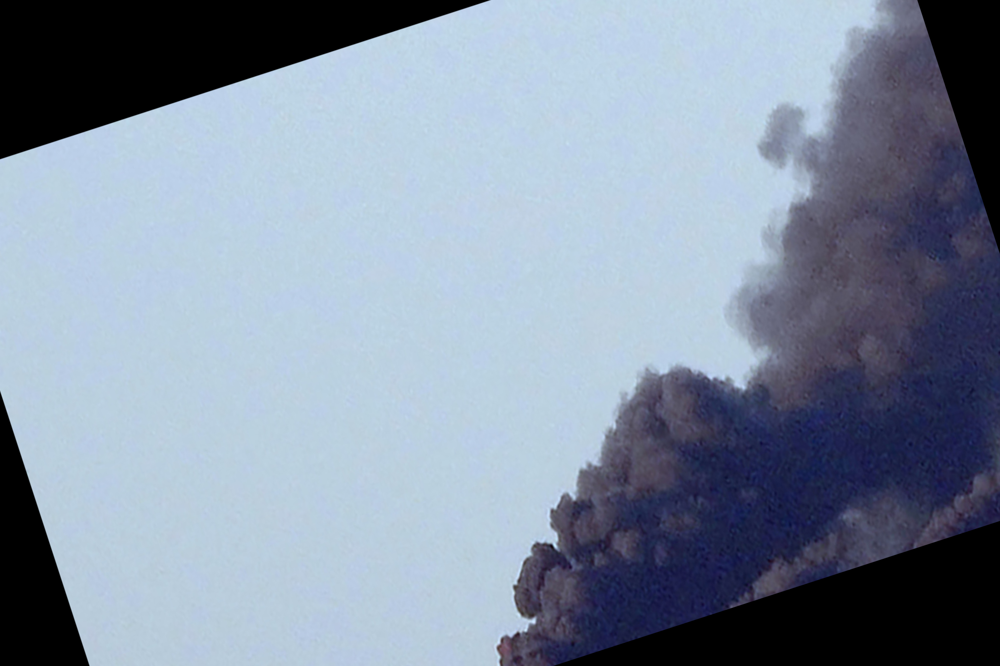

In [ ]:
print("---------------------------")
print("Scaling by  (1.5,2) , rotation by  18∘  and translation by  (10,15)")
print("---------------------------")

##### YOUR CODE STARTS #####

img1_path = './images/img1.jpg'
image = cv.imread(img1_path)

M2 = get_img_scaling_matrix(1.5, 2)
scaled = cv.warpAffine(image, M2, (image.shape[1], image.shape[0]))


M = get_img_rotation_matrix(18, (scaled.shape[1] / 2, scaled.shape[0] / 2))
rotated = cv.warpAffine(scaled, M, (scaled.shape[1], scaled.shape[0]),  flags = cv.INTER_LINEAR, borderMode = cv.BORDER_CONSTANT)

M4 = get_img_translation_matrix(10, 15)
translated =  cv.warpAffine(rotated, M4, (rotated.shape[1], rotated.shape[0]))

cv2_imshow(translated)

##### YOUR CODE ENDS #####

print("---------------------------")
print("Translation by  (10,15) , scaling by  (1.5,2) , rotation by  18∘")
print("---------------------------")

##### YOUR CODE STARTS #####

M4 = get_img_translation_matrix(10, 15)
translated =  cv.warpAffine(image, M4, (image.shape[1], image.shape[0]))

M2 = get_img_scaling_matrix(1.5, 2)
scaled = cv.warpAffine(translated, M2, (translated.shape[1], translated.shape[0]))


M = get_img_rotation_matrix(18, (scaled.shape[1] / 2, scaled.shape[0] / 2))
rotated = cv.warpAffine(scaled, M, (scaled.shape[1], scaled.shape[0]),  flags = cv.INTER_LINEAR, borderMode = cv.BORDER_CONSTANT)


cv2_imshow(rotated)



##### YOUR CODE ENDS #####

Do the outputs coincide? Is it possible to obtain same/different result changing the order of transformations? Which conditions should be met?

*(Your answer goes here)*\
No, the results are not be the same. The order in which you apply transformations to an image can have a significant effect on the final output.

In the first case, the scaling operation is applied before the rotation, and the rotation is applied before the translation. In the second case, the translation is applied before the scaling, and the scaling is applied before the rotation.

Since the operations are applied in a different order, the final result will be different in each case. Therefore, it's important to carefully consider the order of operations when applying transformations to an image to achieve the desired result.

## Summary

### What is a transformation matrix?

Transformation matrix is a matrix that transforms one vector into another by process of matrix multiplication. 

A transformation matrix is a mathematical tool used to represent geometric transformations of objects or images in space. It is a square matrix that encodes the rotation, translation, scaling, or perspective transformation of an object in a multi-dimensional space. By multiplying the transformation matrix with a vector or a point in the object, the transformed vector or point can be obtained. The transformation matrix can also be used to combine or compose multiple transformations, allowing for complex transformations of objects in space. 

### How its shape and values affect the resulting image? What is a shape of a typical transformation matrix that is applied to images; which factors affect its shape?

The shape and values of a transformation matrix can significantly affect the resulting image when applying a geometric transformation. The shape of the matrix depends on the number of dimensions of the space being transformed. For example, a 2D transformation requires a 3x3 matrix, while a 3D transformation requires a 4x4 matrix.

The values of the matrix represent the transformation itself, such as rotation, scaling, translation, or perspective transformation. Different values will produce different transformations, which can have a significant impact on the resulting image. For instance, rotating an image by a certain angle can create a completely different look compared to scaling or translating the same image by the same amount.

In general, the shape of the transformation matrix depends on the number of dimensions of the space being transformed, as well as the type of transformation being applied. Other factors that can affect the shape of the transformation matrix include the number of parameters needed to define the transformation, the level of detail required in the transformation, and the computational resources available for performing the transformation.

### What can be a result of composition of transformations?

The composition of transformations is the process of applying multiple transformations successively to an object or image. When you compose transformations, you apply one transformation after another to get a final combined transformation.

The result of composition of transformations depends on the order in which the transformations are applied. In general, when you apply multiple transformations in sequence, the resulting transformation is not commutative. In other words, the order in which the transformations are applied matters and affects the final result.

For example, let's say we have two transformations, a rotation and a translation. If we first apply the rotation and then the translation, the resulting image will be rotated and then translated. However, if we first apply the translation and then the rotation, the resulting image will be translated and then rotated, which will produce a different final image.

To properly compose transformations, we need to specify the order in which they are applied. This can be done by multiplying

### What is a perspective shift transformation in terms of geometry?

In geometry, perspective shift transformation, also known as perspective projection, is a type of transformation that projects a three-dimensional (3D) object onto a two-dimensional (2D) plane, simulating the perspective view that would be seen by an observer at a finite distance from the object. The perspective projection is a non-linear transformation that preserves lines but not angles or lengths, and results in an image that appears smaller as it is farther away from the observer.